# Running on new images
This notebook will walk you step by step through the process of using a pre-trained model to detect traffic signs in an image.

# Imports

In [20]:
import warnings
# warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
import numpy as np
import os
import tensorflow as tf
from matplotlib import pyplot as plt
from PIL import Image
import glob as glob
import random

%matplotlib inline

# Environment setup

In [21]:

import sys

sys.path.append('../models/research')  # Replace with the path to TensorFlow Object Detection API
sys.path.append('../darkflow')  # Replace with the path to Darkflow

from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util


# Tensorflow Object Detection API

## Model preparation 

In [22]:
# MODEL_NAME = 'faster_rcnn_inception_resnet_v2_atrous'
# MODEL_NAME = 'faster_rcnn_resnet_101'
# MODEL_NAME = 'faster_rcnn_resnet50'
MODEL_NAME = 'faster_rcnn_inception_v2'
# MODEL_NAME = 'rfcn_resnet101'
# MODEL_NAME = 'ssd_inception_v2'
# MODEL_NAME = 'ssd_mobilenet_v1'

In [23]:
# Path to frozen detection graph. This is the actual model that is used for the traffic sign detection.
MODEL_PATH = os.path.join('models', MODEL_NAME)
PATH_TO_CKPT = os.path.join(MODEL_PATH,'inference_graph/frozen_inference_graph.pb')

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join('gtsdb_data', 'gtsdb3_label_map.pbtxt')

NUM_CLASSES = 3

## Load a (frozen) Tensorflow model into memory

In [24]:
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

## Loading label map
Label maps map indices to category names, so that when our convolution network predicts `2`, we know that this corresponds to `mandatory`.

In [25]:
PATH_TO_LABELS = '/home/yuxing/my_project/traffic-sign-detection/gtsdb_data/gtsdb3_label_map.pbtxt'

label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)
print(label_map)

item {
  name: "prohibitory"
  id: 1
}
item {
  name: "mandatory"
  id: 2
}
item {
  name: "danger"
  id: 3
}



## Helper code

In [26]:
def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)

## Detection

In [27]:

PATH_TO_TEST_IMAGES_DIR = '/home/yuxing/my_project/traffic-sign-detection/test_images'

TEST_IMAGE_PATHS = glob.glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))

# Size, in inches, of the output images.
IMAGE_SIZE = (20, 20)

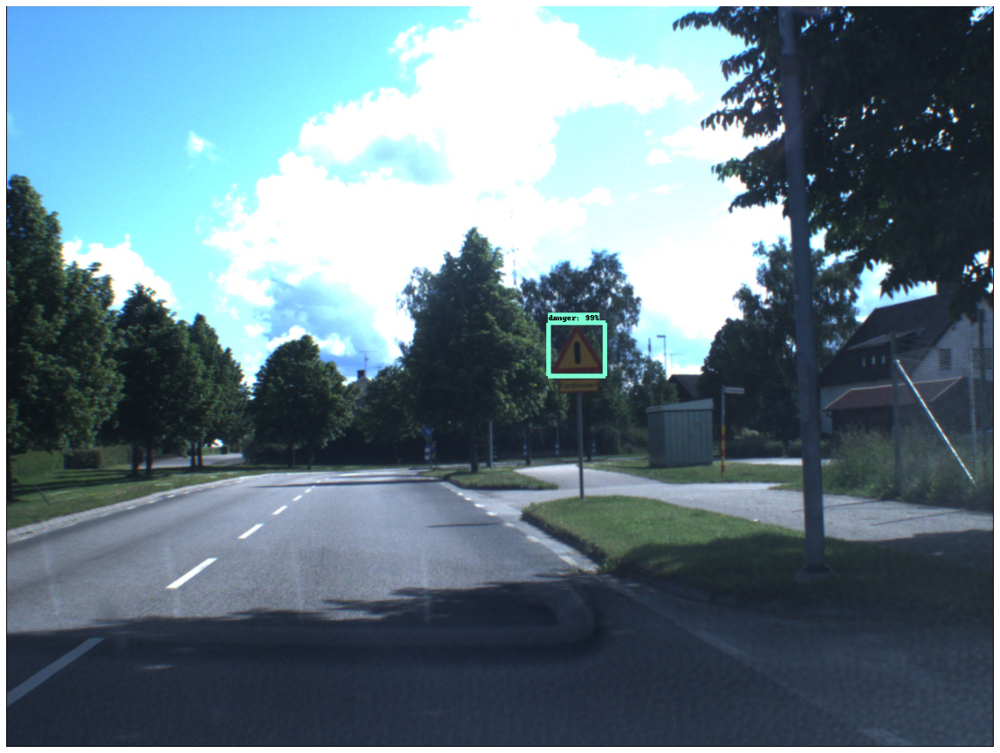

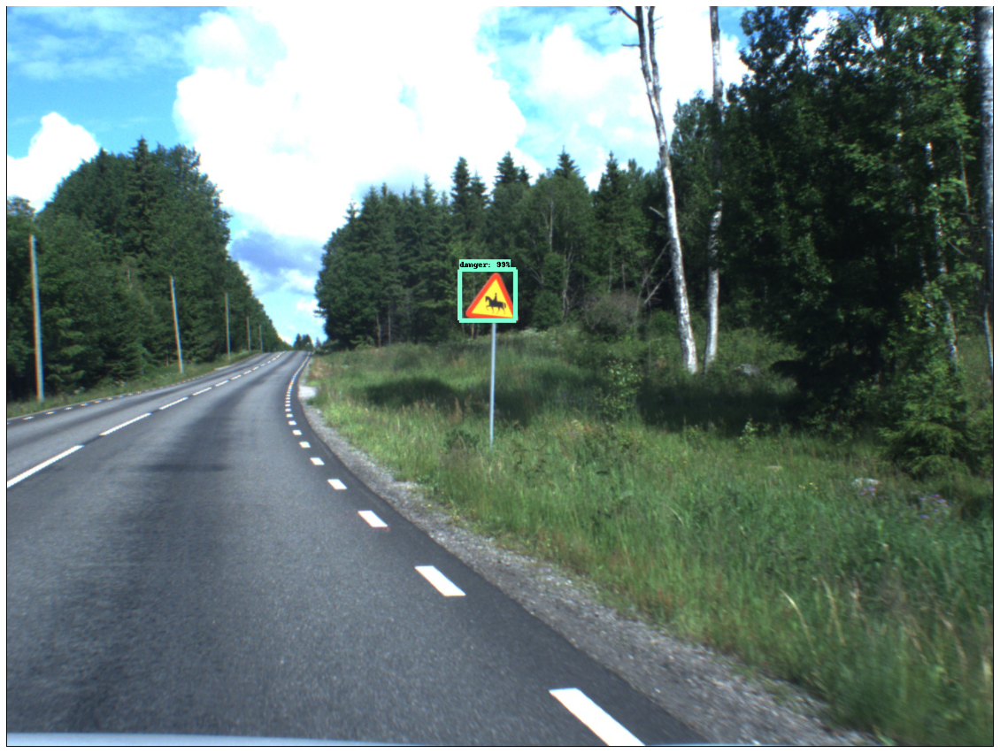

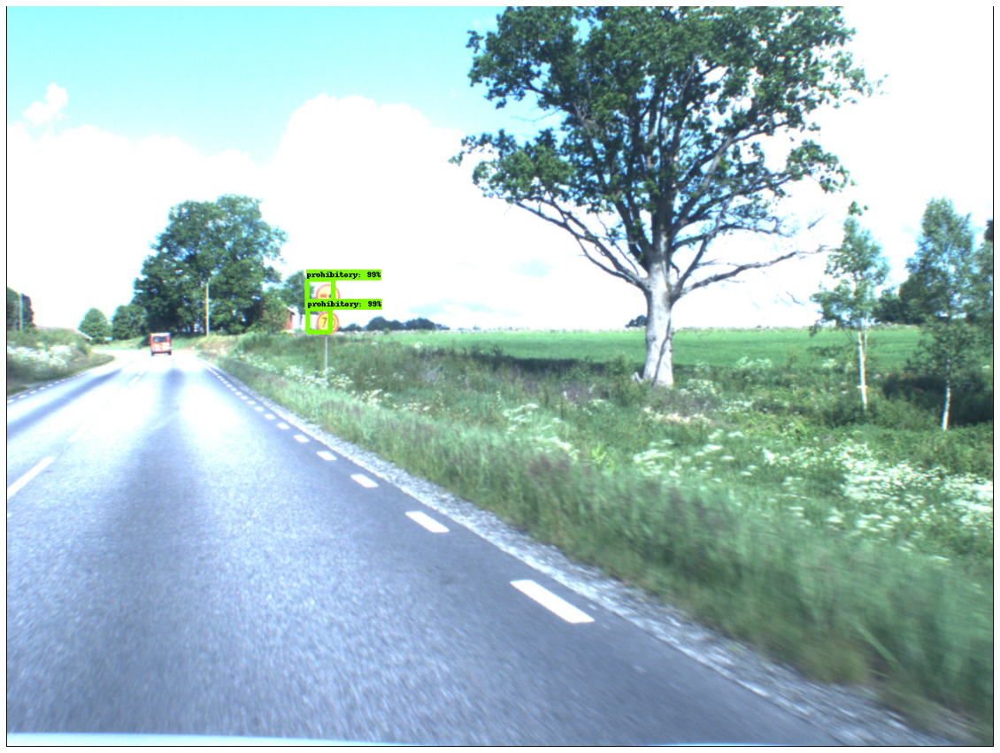

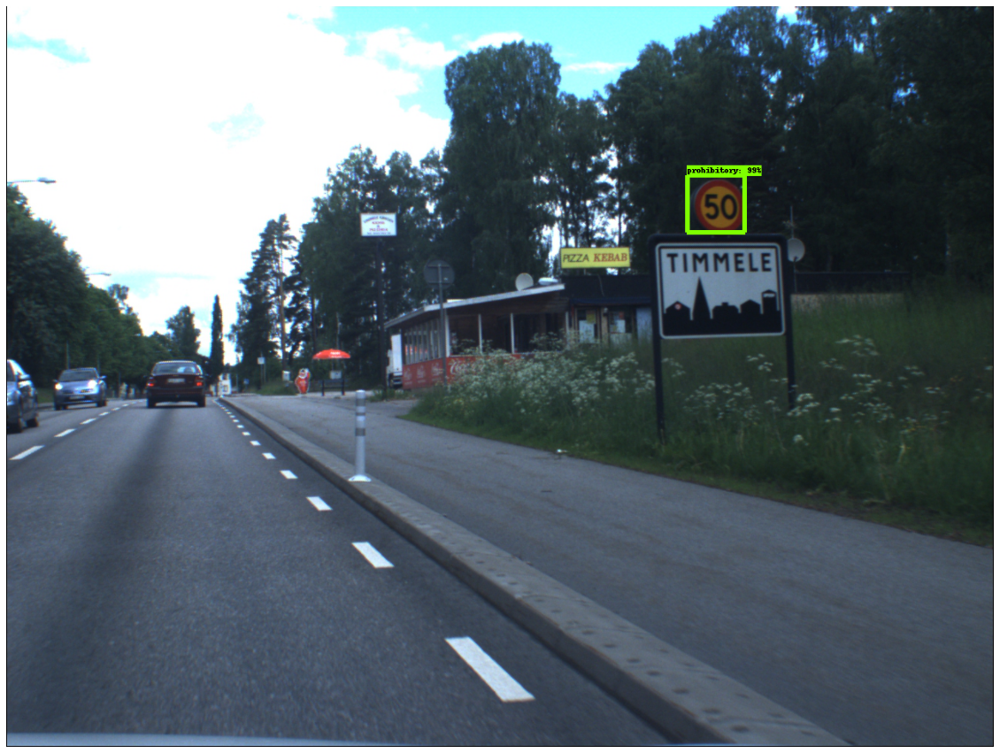

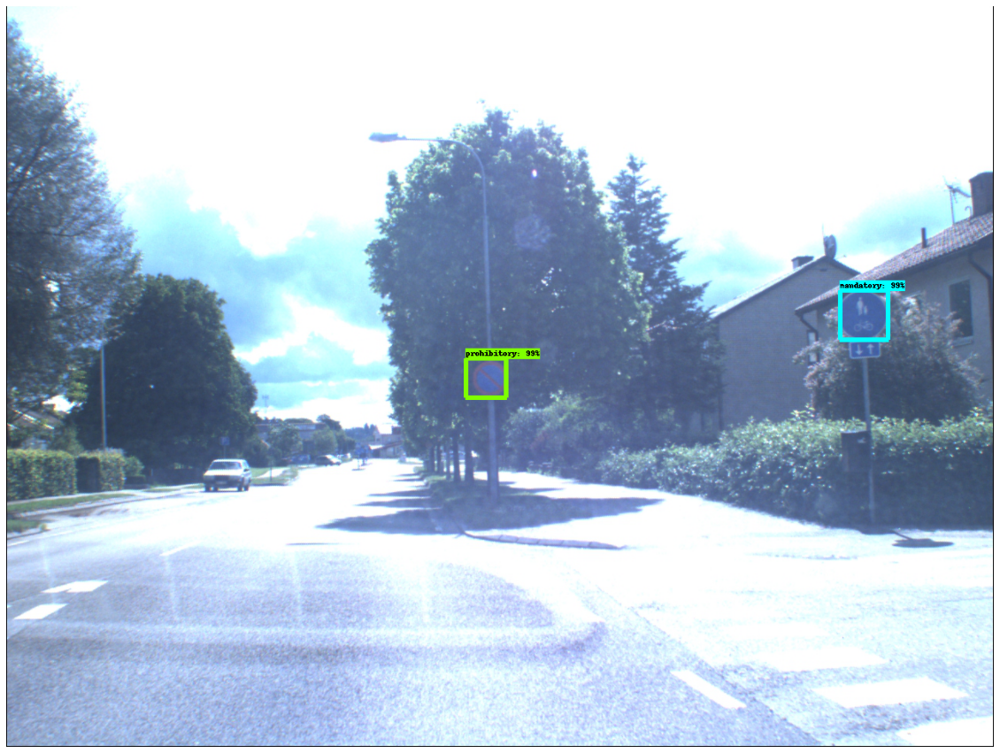

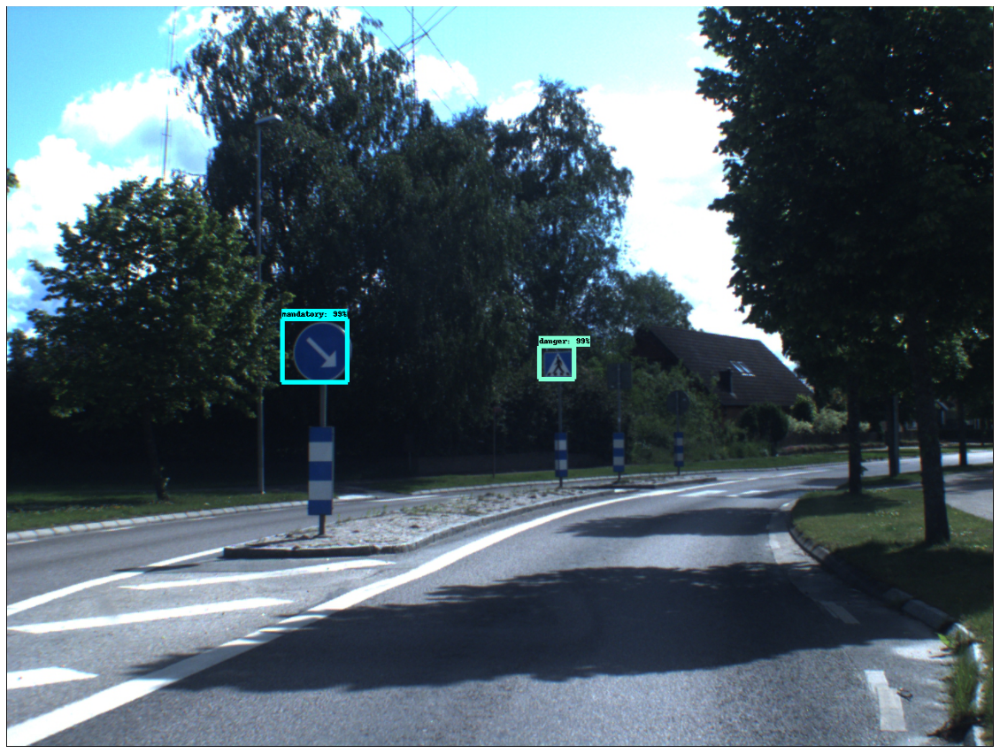

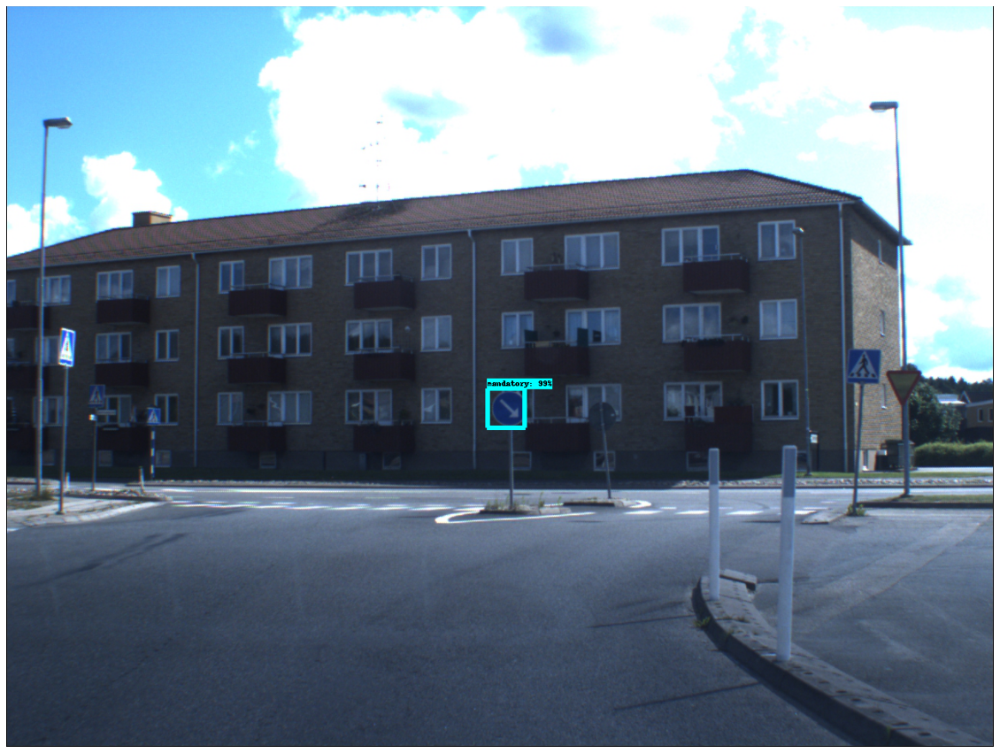

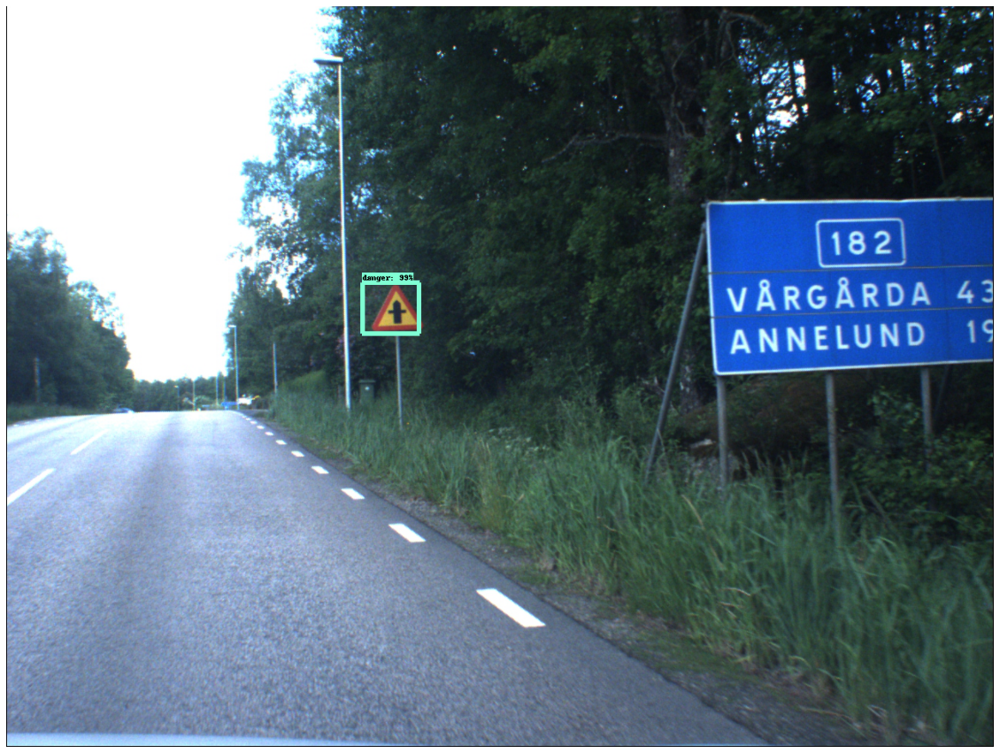

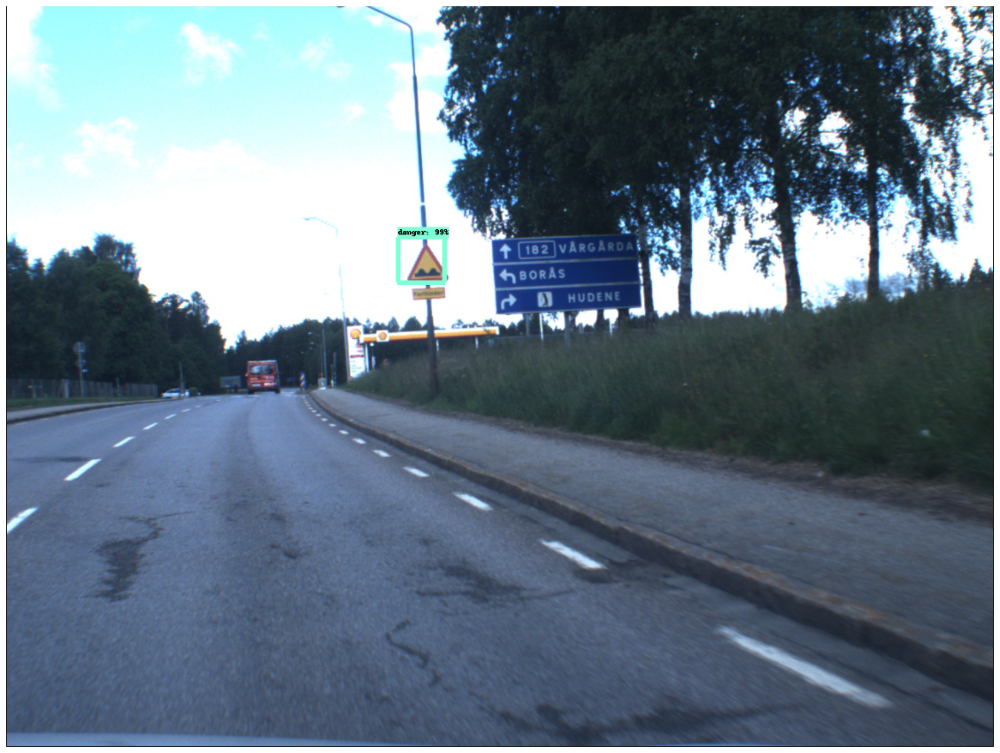

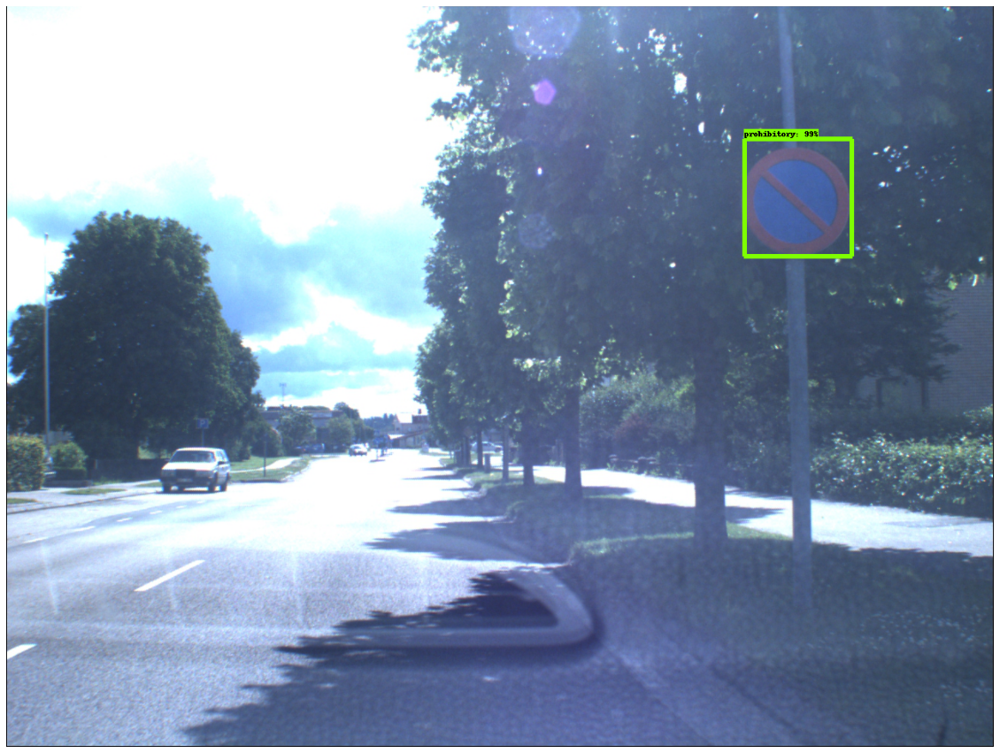

In [28]:
confidence_threshold = 0.5

with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        for idx, image_path in enumerate(TEST_IMAGE_PATHS):
            image = Image.open(image_path)
            # the array based representation of the image will be used later in order to prepare the
            # result image with boxes and labels on it.
            image_np = load_image_into_numpy_array(image)
            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_np_expanded = np.expand_dims(image_np, axis=0)
            image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
            # Each box represents a part of the image where a particular object was detected.
            boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
            # Each score represent how level of confidence for each of the objects.
            # Score is shown on the result image, together with the class label.
            scores = detection_graph.get_tensor_by_name('detection_scores:0')
            classes = detection_graph.get_tensor_by_name('detection_classes:0')
            num_detections = detection_graph.get_tensor_by_name('num_detections:0')
            # Actual detection.
            (boxes, scores, classes, num_detections) = sess.run(
                [boxes, scores, classes, num_detections],
                feed_dict={image_tensor: image_np_expanded})
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np,
                np.squeeze(boxes),
                np.squeeze(classes).astype(np.int32),
                np.squeeze(scores),
                category_index,
                use_normalized_coordinates=True,
                line_thickness=6)
            plt.figure(idx, figsize=IMAGE_SIZE)
            plt.axis('off')
            plt.imshow(image_np)


## Restore the model

In [29]:
# with tf.Session() as sess:
#     saver = tf.train.import_meta_graph('path_to_model.meta')  # Change this to your model's meta file
#     saver.restore(sess, tf.train.latest_checkpoint('./'))  # This assumes your model checkpoints are in the current directory

#     for tensor in tf.get_default_graph().as_graph_def().node:
#         print(tensor.name)


In [30]:
# import tensorflow as tf

# # Set the path to the meta file and checkpoint prefix
# meta_path = "/home/yuxing/my_project/traffic-sign-detection/models/research/lfads/synth_data/trained_itb/model-65000.meta"
# checkpoint_path = "/home/yuxing/my_project/traffic-sign-detection/models/research/lfads/synth_data/trained_itb/model-65000"  # without the .meta or other extensions

# with tf.Session() as sess:
#     # Import the computation graph
#     saver = tf.train.import_meta_graph(meta_path)
    
#     # Restore the weights into the graph
#     saver.restore(sess, checkpoint_path)
    
#     # The model is now restored and ready for use
#     # ... (your further operations using the session)


## Method 1: generate_adversarial_image

Input: A TensorFlow session and an expanded input image.

### Steps:

Get the required logits and scores tensors from the graph.

Identify the predicted class from the scores tensor.

Calculate the log probabilities.

Define the loss as the negative log probability of the predicted class.

Compute gradient of the logits tensor with respect to the input image.

Calculate adversarial perturbations using the sign of the gradient multiplied by epsilon.

Add perturbations to the original image to get the adversarial image.

Clip and convert the adversarial image to uint8 format.

Run the session to get the adversarial image.

Output: Adversarial image and gradients.

In [31]:
# def generate_adversarial_image(sess, input_image_np_expanded, image_tensor):
#     # Fetch the required tensors
#     logits_tensor = detection_graph.get_tensor_by_name('SecondStagePostprocessor/scale_logits:0')
    
#     # Convert the image tensor to float
#     image_tensor_float = tf.cast(image_tensor, tf.float32) / 255.0

#     # Diagnostic: Print tensors and their shapes
#     print(f"logits_tensor: {logits_tensor}")
#     print(f"logits_tensor shape: {logits_tensor.get_shape()}")
#     print(f"image_tensor_float: {image_tensor_float}")
#     print(f"image_tensor_float shape: {image_tensor_float.get_shape()}")
#     print(f"Image tensor float: {image_tensor_float}")

#     # # Print first few elements of tensors and their shapes
#     # print("logits_tensor first few values:", logits_tensor[0, :5])  # Fetching first 5 elements of the second dimension for the first batch item.
#     # print("image_tensor_float first few values:", image_tensor_float[0, :2, :2, :])  # Fetching first 2x2 pixels for all channels of the first image.

#     # Fetch the scores_tensor
#     scores_tensor = detection_graph.get_tensor_by_name('SecondStagePostprocessor/convert_scores:0')
#     print(f"Scores tensor: {scores_tensor}")

#     # Take the maximum score as the class of interest (assuming it's the correct class)
#     predicted_class = tf.argmax(scores_tensor, axis=2)

#     log_probs = tf.nn.log_softmax(scores_tensor, axis=2)

#     # Loss: negative log probability of the correct class
#     loss = -tf.reduce_sum(log_probs * tf.one_hot(predicted_class, depth=scores_tensor.shape[2]), axis=2)


#     # # Now compute gradient with respect to this loss
#     # grads = tf.gradients(loss, image_tensor_float)

#     # Compute gradient of loss with respect to the input image tensor
#     grads = tf.gradients(logits_tensor, image_tensor_float)

#     if None in grads:
#         print("Found a None gradient.")

#     # if grads[0] is None:
#     #     raise ValueError("Gradient is None. Check the differentiability of the operations.")
    
#     # Check if the gradient is None
#     if grads[0] is None:
#         adversarial_image_np = None
    
#     # Compute adversarial perturbations using the gradient sign method
#     perturbations = epsilon * tf.sign(grads[0])

#     # Add the perturbations to the original image to get the adversarial image
#     adversarial_image = tf.clip_by_value(image_tensor_float + perturbations, 0, 1)

#     # Convert back to uint8 format for visualization
#     adversarial_image = tf.cast(adversarial_image * 255.0, tf.uint8)

#     # Run the TensorFlow session to get the adversarial image
#     adversarial_image_np = sess.run(adversarial_image)

#     return adversarial_image_np, grads

# epsilon = 0.01

# with detection_graph.as_default():
#     with tf.Session(graph=detection_graph) as sess:
#         for idx, image_path in enumerate(TEST_IMAGE_PATHS):
#             image = Image.open(image_path)
#             image_np = load_image_into_numpy_array(image)
#             image_np_expanded = np.expand_dims(image_np, axis=0)

#             image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
            
#             # Generate the adversarial image and get the gradients
#             adversarial_image_np, gradients = generate_adversarial_image(sess, image_np_expanded, image_tensor)
            
#             # If the gradient is None, print diagnostic information
#             if gradients[0] is None:
#                 logits_tensor = detection_graph.get_tensor_by_name('SecondStagePostprocessor/scale_logits:0')
#                 loss_gradient = sess.run(tf.gradients(loss, logits_tensor), feed_dict={image_tensor: image_np_expanded})
#                 logits_gradient = sess.run(tf.gradients(logits_tensor, image_tensor_float), feed_dict={image_tensor: image_np_expanded})
            
#             image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
#             boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
#             scores = detection_graph.get_tensor_by_name('detection_scores:0')
#             classes = detection_graph.get_tensor_by_name('detection_classes:0')
#             num_detections = detection_graph.get_tensor_by_name('num_detections:0')

#             # Use adversarial_image_np for detection instead of original image_np_expanded
#             (boxes, scores, classes, num_detections) = sess.run(
#                 [boxes, scores, classes, num_detections],
#                 feed_dict={image_tensor: adversarial_image_np})

#             vis_util.visualize_boxes_and_labels_on_image_array(
#                 adversarial_image_np[0], # Note the change here to take the first element from the expanded dimension
#                 np.squeeze(boxes),
#                 np.squeeze(classes).astype(np.int32),
#                 np.squeeze(scores),
#                 category_index,
#                 use_normalized_coordinates=True,
#                 line_thickness=6)
            
#             plt.figure(idx, figsize=IMAGE_SIZE)
#             plt.axis('off')
#             plt.imshow(adversarial_image_np[0])


## Method 2: Fast Gradient Method

Input: A detection model, an input tensor, a session, and parameters like epsilon, epochs, etc.

### Steps:

Compute logits and scores using the model.

Get the predicted class from scores.

Create a one-hot target tensor.

Calculate the loss using softmax cross-entropy.

Compute gradient of the loss with respect to the adversarial image.

Update the adversarial image using either the sign of the gradient (sign method) or the gradient itself, multiplied by epsilon (step size).

Clip the adversarial image to ensure pixel values remain in [0,1].

If epochs > 1, repeat the above steps for the specified number of epochs.

Output: Adversarial image.

IndexError: list index out of range

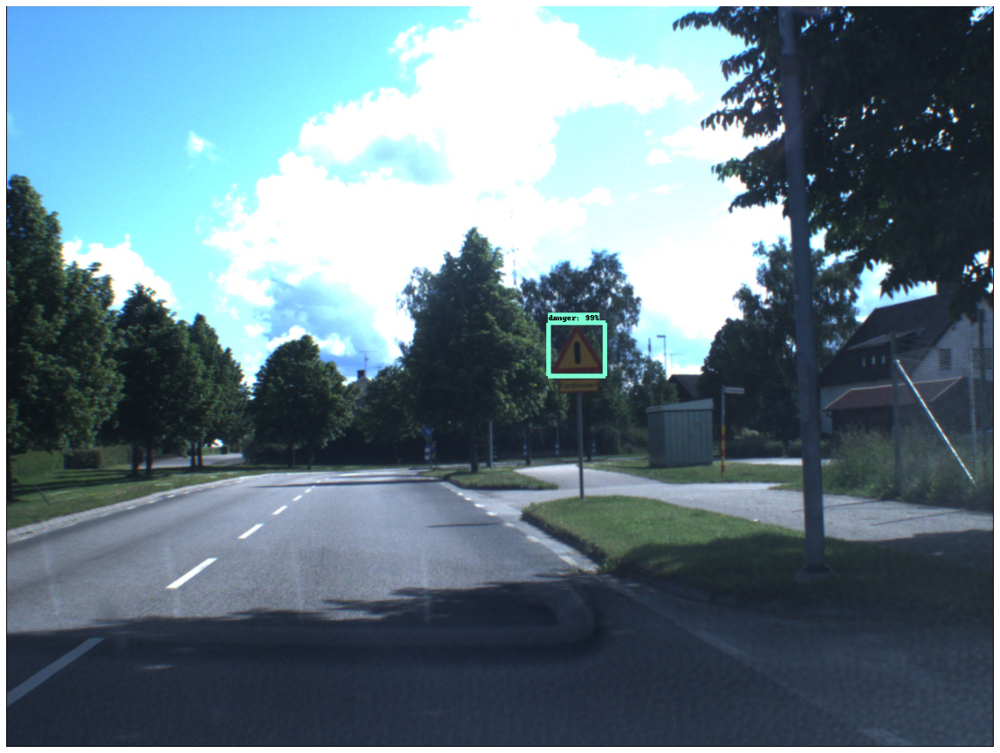

In [32]:

def model_wrapper(input_tensor_placeholder, input_data, sess, image_tensor):
    logits_tensor = detection_graph.get_tensor_by_name('SecondStagePostprocessor/scale_logits/y:0')  
    scores_tensor = detection_graph.get_tensor_by_name('SecondStagePostprocessor/convert_scores:0')
    
    feed_dict = {image_tensor: input_data, input_tensor_placeholder: input_data}
    logits, scores = sess.run([logits_tensor, scores_tensor], feed_dict=feed_dict)
    return logits, scores

def fgm(model, x_placeholder, x_input, sess, image_tensor, target=None, eps=0.01, epochs=1, sign=True, clip_min=0.0, clip_max=1.0):
    xadv = tf.identity(x_placeholder)
    logits, scores = model(x_placeholder, x_input, sess, image_tensor)

    predicted_class = tf.argmax(logits, 1)
    target_class = (predicted_class + 1) % 3 + 1

    target = tf.one_hot(target_class - 1, depth=3)
    target = tf.expand_dims(target, axis=0)

    logits = tf.expand_dims(logits, axis=0) if len(logits.shape) == 1 else logits
    loss = tf.nn.softmax_cross_entropy_with_logits_v2(logits=logits, labels=target)
    
    for _ in range(epochs):
        dy_dx, = tf.gradients(loss, xadv)
        dy_dx_sign = tf.sign(dy_dx)
        xadv = xadv + eps * (dy_dx_sign if sign else dy_dx)
        xadv = tf.clip_by_value(xadv, clip_min, clip_max)
        
    return xadv

def generate_adversarial_images(sess, image_np_expanded, model_wrapper, x_placeholder, image_tensor):
    detected_classes = np.squeeze(classes)[np.squeeze(scores) > confidence_threshold]
    adversarial_images = []

    for detected_class in detected_classes:
        detected_class_tensor = tf.convert_to_tensor(detected_class, dtype=tf.int32)
        target_class = (detected_class_tensor + 1) % 3 + 1
        target = tf.one_hot(target_class - 1, depth=3)

        adversarial_image_op = fgm(model_wrapper, x_placeholder, image_np_expanded, sess, image_tensor, target=target)
        adversarial_image_np = sess.run(adversarial_image_op, feed_dict={x_placeholder: image_np_expanded})
        adversarial_images.append(adversarial_image_np)
    
    return adversarial_images

# Define tensors
image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
boxes_tensor = detection_graph.get_tensor_by_name('detection_boxes:0')
scores_tensor = detection_graph.get_tensor_by_name('detection_scores:0')
classes_tensor = detection_graph.get_tensor_by_name('detection_classes:0')
num_detections_tensor = detection_graph.get_tensor_by_name('num_detections:0')

with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        x_placeholder = tf.placeholder(tf.float32, shape=image_np_expanded.shape)
        
        for idx, image_path in enumerate(TEST_IMAGE_PATHS):
            image = Image.open(image_path)
            image_np = load_image_into_numpy_array(image)
            image_np_expanded = np.expand_dims(image_np, axis=0)
            
            boxes, scores, classes, num_detections = sess.run([boxes_tensor, scores_tensor, classes_tensor, num_detections_tensor], feed_dict={image_tensor: image_np_expanded})
            
            vis_util.visualize_boxes_and_labels_on_image_array(image_np, np.squeeze(boxes), np.squeeze(classes).astype(np.int32), np.squeeze(scores), category_index, use_normalized_coordinates=True, line_thickness=6)
            
            plt.figure(idx, figsize=IMAGE_SIZE)
            plt.axis('off')
            plt.imshow(image_np)

            adversarial_images = generate_adversarial_images(sess, image_np_expanded, model_wrapper, x_placeholder, image_tensor)

            plt.imshow(adversarial_images[0])
